In [1]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

import numpy as np
import pathlib
import os
import sys
import toml
import pandas as pd
import matplotlib.pyplot as plt

# Checking for outliers using the Z-score method on the numerical columns
from scipy.stats import zscore
import umap.umap_ as umap

while os.path.basename(cwd := os.getcwd()) != "2-term_deposit_marketing":
    os.chdir("..")
    print(f"{cwd=:}")

sys.path.append("./term_deposit")
import term_deposit as td

# Load the configuration file
config = toml.load('config.toml')
target = 'y'

cwd=/workspaces/2-term_deposit_marketing/notebooks


In [22]:
data = pd.read_csv(config['paths']["data"]['raw'])

from sklearn.pipeline import Pipeline
from sklearn.impute import KNNImputer, SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.cluster import KMeans

# Separate the features and the target variable
features = data.drop(columns=['y'])
target = data['y']

# Identifying numerical and categorical features
numerical_features = ['age', 'balance', 'duration', 'campaign']
categorical_features = ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact']

# Define transformers for numerical and categorical data
numerical_transformer = Pipeline(steps=[
    ('imputer', KNNImputer(n_neighbors=5, weights='uniform')),  # KNN Imputer for missing values
    ('scaler', StandardScaler())  # Standardize numerical features
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='unknown')),  # Impute with 'unknown'
    ('onehot', OneHotEncoder(handle_unknown='ignore'))  # One-hot encode categorical features
])

# Combine both transformers into a ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ]
)

# Fit and transform the dataset using the preprocessor
processed_features = preprocessor.fit_transform(features)

# Convert processed features back into a DataFrame for inspection
processed_df = pd.DataFrame(processed_features, columns=preprocessor.get_feature_names_out())

# Feature engineering
processed_df["age_balance"] = processed_df["num__age"] * processed_df["num__balance"]
processed_df["age_duration"] = processed_df["num__age"] * processed_df["num__duration"]
processed_df["age_campaign"] = processed_df["num__age"] * processed_df["num__campaign"]
processed_df["balance_duration"] = processed_df["num__balance"] * processed_df["num__duration"]
processed_df["balance_campaign"] = processed_df["num__balance"] * processed_df["num__campaign"]

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the fo

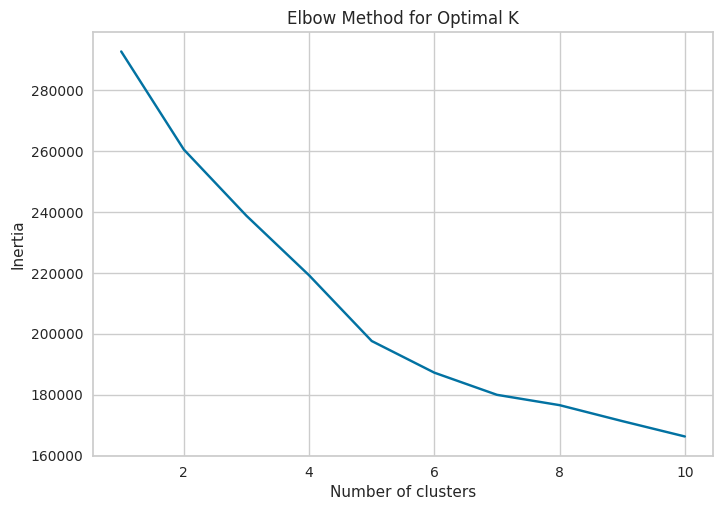

In [23]:
import matplotlib.pyplot as plt

inertia = []
K = range(1, 11)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(processed_features)
    inertia.append(kmeans.inertia_)

plt.plot(K, inertia, 'bx-')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal K')
plt.show()

In [24]:
# Optional: Apply KMeans clustering to the processed features
kmeans = KMeans(n_clusters=5, random_state=42)  # Adjust the number of clusters as needed
clusters = kmeans.fit_predict(processed_features)

In [ ]:
from mpl_toolkits.mplot3d import Axes3D  # For 3D plotting
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap.umap_ as umap

# Applying 3D PCA
pca_3d = PCA(n_components=3)
pca_result_3d = pca_3d.fit_transform(processed_df)

# Applying 3D t-SNE
tsne_3d = TSNE(n_components=3, random_state=42)
tsne_result_3d = tsne_3d.fit_transform(processed_df)

# Applying 3D UMAP
umap_3d = umap.UMAP(n_components=3, random_state=42)
umap_result_3d = umap_3d.fit_transform(processed_df)

In [31]:
import plotly.express as px

# Assuming we have clusters and 3D results from PCA, t-SNE, and UMAP
def plot_3d_interactive(data, clusters, title):
    fig = px.scatter_3d(
        x=data[:, 0], y=data[:, 1], z=data[:, 2],
        color=clusters.astype(str),
        title=f'3D {title} Visualization',
        labels={'x': f'{title} Component 1', 'y': f'{title} Component 2', 'z': f'{title} Component 3'}
    )
    fig.show()

# Assuming the variables are already defined
# Replace these lines with the actual variables when running locally
plot_3d_interactive(pca_result_3d, clusters, 'PCA')
# plot_3d_interactive(tsne_result_3d, clusters, 't-SNE')
# plot_3d_interactive(umap_result_3d, clusters, 'UMAP')

In [38]:
# Adjusting the numerical features to match the transformed column names in the processed DataFrame.

numerical_transformed_features = [f'num__{feature}' for feature in numerical_features]

# Apply Z-score to the correctly named numerical columns
z_scores = np.abs(zscore(processed_df[numerical_transformed_features]))
outliers = (z_scores > 3).any(axis=1)  # Identify rows with any z-score greater than 3

# Calculate the percentage of outliers
outlier_percentage = (outliers.sum() / len(processed_df)) * 100

# Remove outliers for rows where any feature exceeds the Z-score threshold
cleaned_df = processed_df[~outliers]

# Display the percentage of outliers detected
outlier_percentage

6.0424999999999995

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the fo

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the fo

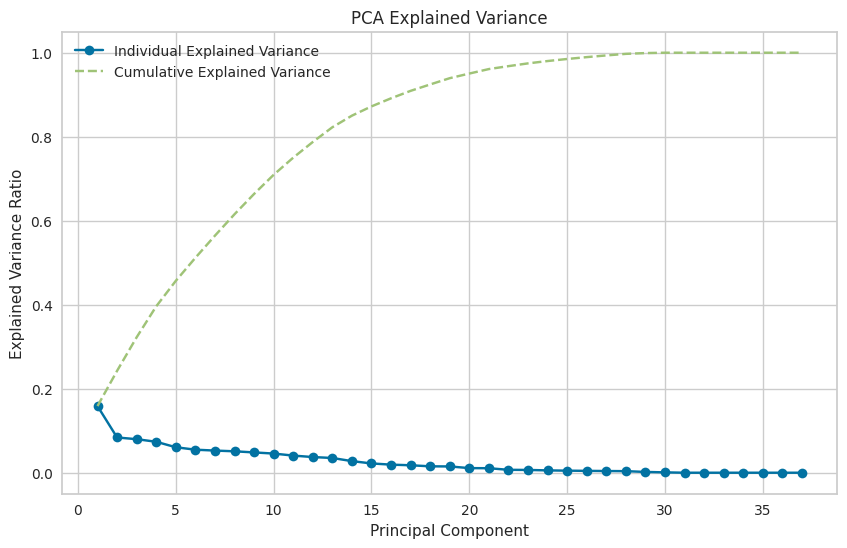

In [39]:
# Applying PCA to the cleaned dataset
pca = PCA()
pca.fit(cleaned_df)

# Calculate the explained variance ratio for each principal component
explained_variance_ratio = pca.explained_variance_ratio_

# Calculate the cumulative explained variance
cumulative_explained_variance = explained_variance_ratio.cumsum()

# Plotting the explained variance and cumulative explained variance
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o', label='Individual Explained Variance')
plt.plot(range(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, marker='x', linestyle='--', label='Cumulative Explained Variance')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('PCA Explained Variance')
plt.legend()
plt.grid(True)
plt.show()

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the fo

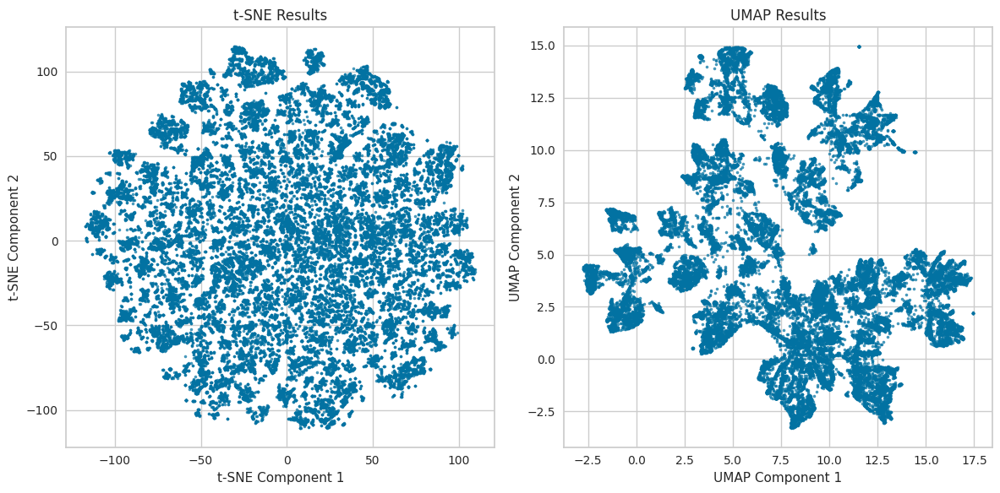

In [40]:
# Applying t-SNE for dimensionality reduction to 2 components
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(cleaned_df)

# Applying UMAP for dimensionality reduction to 2 components
umap_reducer = umap.UMAP(n_components=2, random_state=42)
umap_results = umap_reducer.fit_transform(cleaned_df)

# Plotting the t-SNE results
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(tsne_results[:, 0], tsne_results[:, 1], s=5, alpha=0.7)
plt.title('t-SNE Results')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')

# Plotting the UMAP results
plt.subplot(1, 2, 2)
plt.scatter(umap_results[:, 0], umap_results[:, 1], s=5, alpha=0.7)
plt.title('UMAP Results')
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')

plt.tight_layout()
plt.show()

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the fo

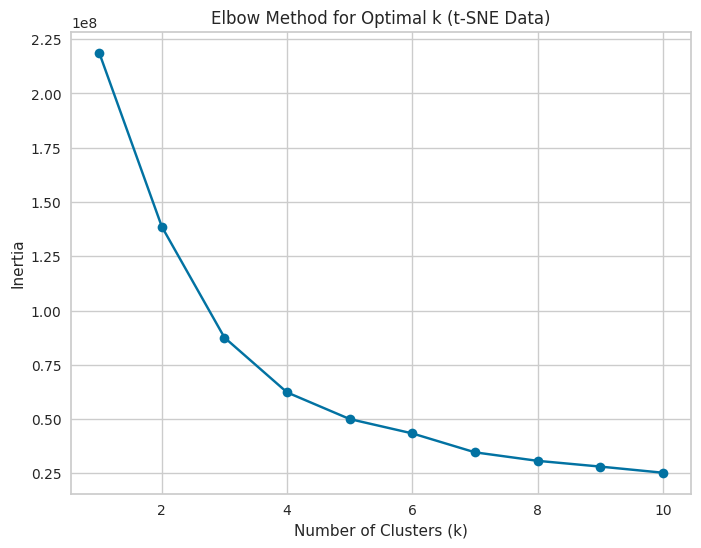

In [41]:
# Determining the optimal number of clusters using the Elbow method
inertia = []
k_range = range(1, 11)

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(tsne_results)
    inertia.append(kmeans.inertia_)

# Plotting the Elbow method graph
plt.figure(figsize=(8, 6))
plt.plot(k_range, inertia, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal k (t-SNE Data)')
plt.grid(True)
plt.show()

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the fo

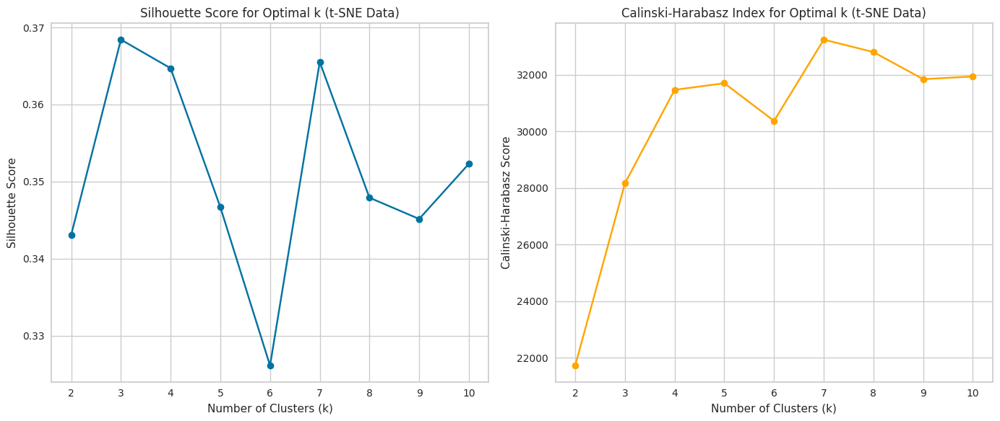

In [42]:
# Define a range of cluster numbers to test
k_range = range(2, 11)

# Lists to store silhouette scores and Calinski-Harabasz scores
silhouette_scores = []
calinski_harabasz_scores = []

# Compute silhouette score and Calinski-Harabasz score for each k
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    cluster_labels = kmeans.fit_predict(tsne_results)
    
    # Calculate the silhouette score
    silhouette_avg = silhouette_score(tsne_results, cluster_labels)
    silhouette_scores.append(silhouette_avg)
    
    # Calculate the Calinski-Harabasz index
    calinski_harabasz_avg = calinski_harabasz_score(tsne_results, cluster_labels)
    calinski_harabasz_scores.append(calinski_harabasz_avg)

# Plotting the silhouette scores and Calinski-Harabasz scores
fig, ax = plt.subplots(1, 2, figsize=(14, 6))

# Silhouette Score Plot
ax[0].plot(k_range, silhouette_scores, marker='o')
ax[0].set_xlabel('Number of Clusters (k)')
ax[0].set_ylabel('Silhouette Score')
ax[0].set_title('Silhouette Score for Optimal k (t-SNE Data)')
ax[0].grid(True)

# Calinski-Harabasz Index Plot
ax[1].plot(k_range, calinski_harabasz_scores, marker='o', color='orange')
ax[1].set_xlabel('Number of Clusters (k)')
ax[1].set_ylabel('Calinski-Harabasz Score')
ax[1].set_title('Calinski-Harabasz Index for Optimal k (t-SNE Data)')
ax[1].grid(True)

plt.tight_layout()
plt.show()

In [47]:
# Set the number of clusters based on the analysis
n_clusters = 7

# Applying K-means clustering
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans_labels = kmeans.fit_predict(cleaned_df)

# Calculate the silhouette score and Calinski-Harabasz index for the clustering
silhouette_avg = silhouette_score(cleaned_df, kmeans_labels)
calinski_harabasz_avg = calinski_harabasz_score(cleaned_df, kmeans_labels)

# Adding the cluster labels to the dataset
cleaned_df['Cluster'] = kmeans_labels

# Display the silhouette score, Calinski-Harabasz index, and the head of the dataset with cluster labels
silhouette_avg, calinski_harabasz_avg, cleaned_df.head()

(0.12392176023400246,
 3611.6891217096913,
    num__age  num__balance  num__duration  num__campaign  cat__job_admin  \
 0  1.810415      0.299174       0.023811      -0.581096             0.0   
 1  0.358382     -0.428854      -0.400305      -0.581096             0.0   
 2 -0.782501     -0.438152      -0.689474      -0.581096             0.0   
 3  0.669532      0.079802      -0.627785      -0.581096             0.0   
 4 -0.782501     -0.438497      -0.219092      -0.581096             0.0   
 
    cat__job_blue-collar  cat__job_entrepreneur  cat__job_housemaid  \
 0                   0.0                    0.0                 0.0   
 1                   0.0                    0.0                 0.0   
 2                   0.0                    1.0                 0.0   
 3                   1.0                    0.0                 0.0   
 4                   0.0                    0.0                 0.0   
 
    cat__job_management  cat__job_retired  ...  cat__loan_yes  \
 0    

In [63]:
# 3D plot of the clusters using PCA
pca_result_3d = pca_3d.fit_transform(cleaned_df)
plot_3d_interactive(pca_result_3d, kmeans_labels, 'PCA')

In [65]:
pca_3d.get_params()

{'copy': True,
 'iterated_power': 'auto',
 'n_components': 3,
 'n_oversamples': 10,
 'power_iteration_normalizer': 'auto',
 'random_state': None,
 'svd_solver': 'auto',
 'tol': 0.0,
 'whiten': False}

In [68]:
pd.DataFrame(pca_result_3d).assign(cluster=kmeans_labels).to_parquet("pca_result_3d.parquet", index=False, compression="brotli")

In [60]:
# 3D plot of the clusters using t-SNE
tsne_result_3d = tsne_3d.fit_transform(cleaned_df)
plot_3d_interactive(tsne_result_3d, kmeans_labels, 'PCA')

In [62]:
# 3D plot of the clusters using uMAP
umap_result_3d = umap_3d.fit_transform(cleaned_df)
plot_3d_interactive(umap_result_3d, kmeans_labels, 'PCA')